# Image segmentation via texture

#### Authors
* Gabriel de Oliveira Pontarolo
* Jennifer Mayara de Paiva Goberski

#### NWPU-RESIC45 Dataset
* Cheng, G., Han, J., & Lu, X. (2017). Remote Sensing Image Scene Classification: Benchmark and State of the Art. Proceedings of the IEEE, 105(10), 1865-1883.

### Imports and load dataset

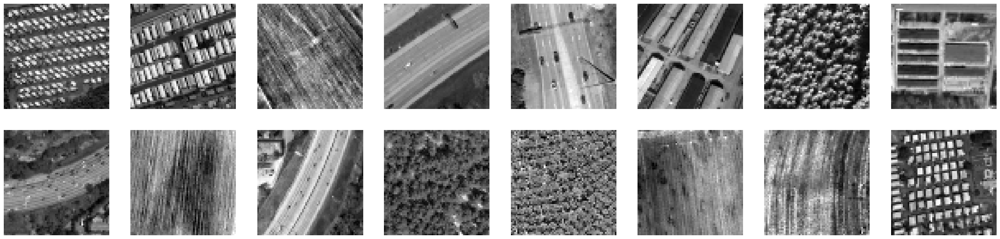

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

DATASET_DIR = "./Data/NWPU-RESIC45-sample"

img_paths = [os.path.join(DATASET_DIR, img_path) for img_path in os.listdir(DATASET_DIR)]
imgs_hsv = [cv2.imread(file, cv2.COLOR_RGB2HSV) for file in img_paths]

# get the value component
imgs = [img[:,:,2] for img in imgs_hsv]

# resize all to 1280x720
# imgs = [cv2.resize(img, (1280, 720)) for img in imgs]

# show the images
fig, axes = plt.subplots(2, len(imgs)//2, figsize=(len(imgs)*2, len(imgs)//2))
for ax, img in zip(axes.flatten(), imgs):
    ax.imshow(img, cmap='gray')
    ax.axis('off')

### Create filter kernels

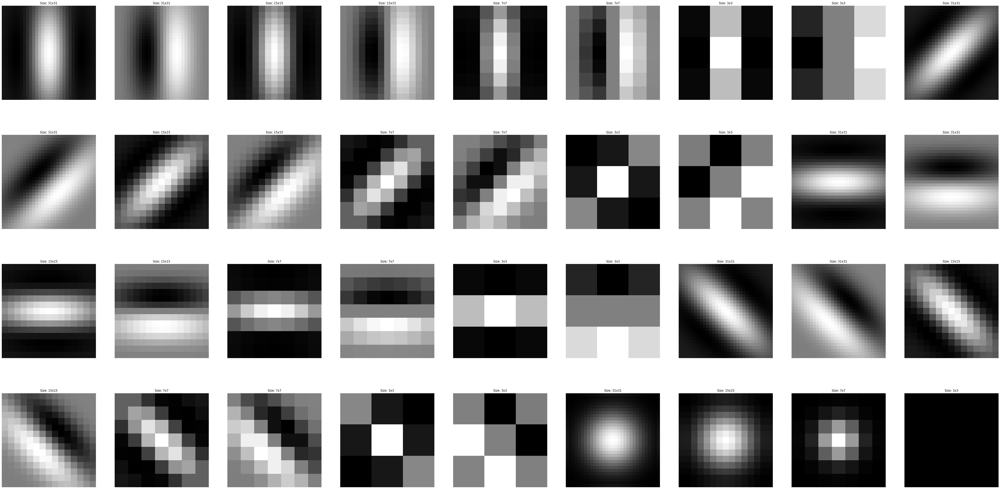

In [2]:
KERNEL_SIZE = 31
SIZE_FACTORS = 4
KERNEL_ORIENTATIONS = [0, np.pi/4, np.pi/2, 3*np.pi/4]
KERNEL_OFFSETS = [0, np.pi/2]

# calculate kernel sizes
next_odd = lambda x: x if (x % 2 == 1) else x + 1 # ensure kernel sizes are odd
kernel_sizes = [next_odd(KERNEL_SIZE//pow(2, sf)) for sf in range(SIZE_FACTORS)]

# create garbor kernels for different border orientations
"""
Gabor kernels:
    ksize: Size of the filter returned.
    sigma: Standard deviation of the gaussian envelope.
    theta: Orientation of the normal to the parallel stripes of a Gabor function.
    lambda: Wavelength of the sinusoidal factor.
    gamma: Spatial aspect ratio.
    psi: Phase offset.
"""
kernels = []
for theta in KERNEL_ORIENTATIONS:
    for ksize in kernel_sizes:
        for psi in KERNEL_OFFSETS:
            kernel = cv2.getGaborKernel(ksize=(ksize, ksize), sigma=ksize/5, theta=theta, lambd=ksize, gamma=0.50, psi=psi, ktype=cv2.CV_32F)
            kernels.append(kernel)

# Use gaussian blur to generate a circular kernel
for ksize in kernel_sizes:
    circular_kernel = np.zeros((ksize, ksize), dtype=np.float32)
    circular_kernel[int(ksize/2), int(ksize/2)] = 1
    circular_kernel = cv2.GaussianBlur(circular_kernel, (ksize, ksize), sigmaX=ksize//5)
    kernels.append(circular_kernel)

# show the kernels
fig, axes = plt.subplots(SIZE_FACTORS, len(kernels)//SIZE_FACTORS, figsize=(len(kernels)*2, len(kernels)))
for ax, kernel in zip(axes.flatten(), kernels):
    ax.imshow(kernel, cmap='gray')
    ax.set_title(f"Size: {kernel.shape[0]}x{kernel.shape[1]}")
    ax.axis('off')


### Apply filter bank to the dataset

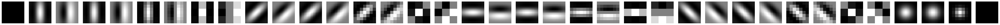

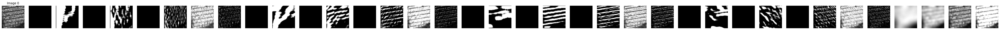

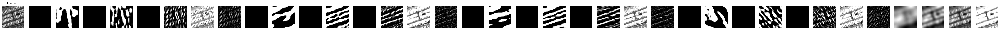

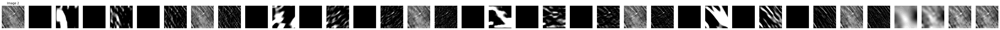

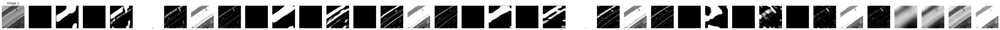

...

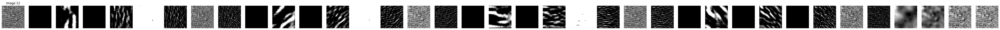

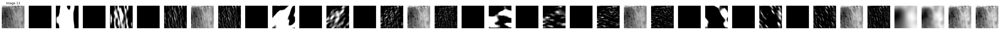

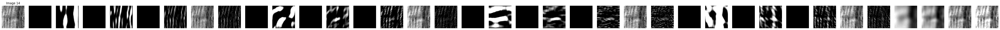

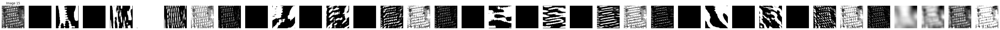

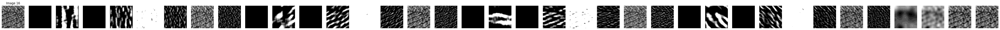

In [3]:
PATCH_NUM = 4  # will split the feature response into PATCH_NUM x PATCH_NUM

def get_feature_vector(kernel_response):

    # divide the image into patches
    height, width = kernel_response.shape
    window_height = height // PATCH_NUM
    window_width = width // PATCH_NUM

    feature_vector = np.zeros((PATCH_NUM, PATCH_NUM), dtype=np.uint8)
    for i in range(0, height, window_height):
        for j in range(0, width, window_width):

            # find the average response in the window
            window = kernel_response[i:i+window_height, j:j+window_width]
            avg_response = np.mean(window)
            feature_vector[i//window_height, j//window_width] = avg_response

    return feature_vector.flatten()

# show filters
fig, axes = plt.subplots(1, len(kernels) + 1, figsize=((len(kernels) + 1)*2, len(kernels) + 1))
axes[0].imshow(np.zeros((KERNEL_SIZE, KERNEL_SIZE)), cmap='gray')
axes[0].axis('off')
for i in range(len(kernels)):
    axes[i + 1].imshow(kernels[i], cmap='gray')
    axes[i + 1].axis('off')

kernel_responses = []
for i, img in enumerate(imgs):

    kernel_responses.append([])
    height, width = img.shape

    # show the image
    fig, axes = plt.subplots(1, len(kernels) + 1, figsize=(len(kernels)*2, 2))
    axes[0].imshow(imgs[i], cmap='gray')
    axes[0].set_title(f"Image {i}")
    axes[0].axis('off')

    for j, kernel in enumerate(kernels):
        # apply each kernel to the image
        response = cv2.filter2D(img, -1, kernel)
        response = cv2.normalize(response, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
        
        # show the kernel responses
        axes[j + 1].imshow(response, cmap='gray')
        axes[j + 1].axis('off')

        feature_vector = get_feature_vector(response)
        kernel_responses[i].append(feature_vector)


### Show the kernel response for each filter

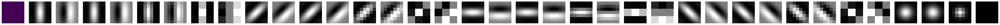

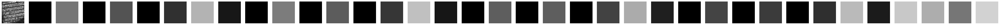

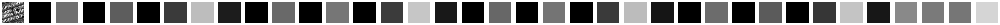

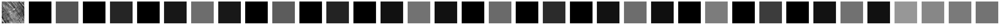

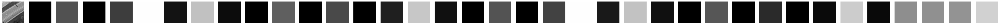

...

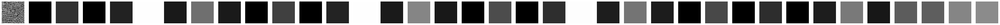

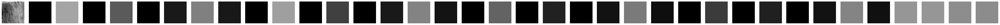

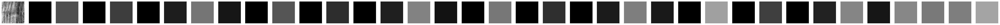

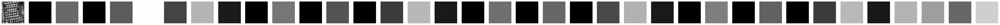

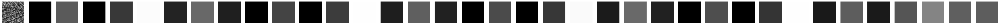

In [4]:
# show filters
fig, axes = plt.subplots(1, len(kernels) + 1, figsize=((len(kernels) + 1)*2, len(kernels) + 1))
axes[0].imshow(np.zeros((KERNEL_SIZE, KERNEL_SIZE)))
axes[0].axis('off')
for i in range(len(kernels)):
    axes[i + 1].imshow(kernels[i], cmap='gray')
    axes[i + 1].axis('off')

# show kernel responses for each filter as an image
for i in range(len(imgs)):
    fig, axes = plt.subplots(1, len(kernels) + 1, figsize=((len(kernels) + 1)*2, len(kernels) + 1))
    axes[0].imshow(imgs[i], cmap='gray')
    axes[0].axis('off')
    for j in range(len(kernels)):
        response = int(np.mean(kernel_responses[i][j])) 
        response_img = cv2.cvtColor(np.full((KERNEL_SIZE, KERNEL_SIZE), response, dtype=np.uint8), cv2.COLOR_GRAY2BGR)
        axes[j + 1].imshow(response_img, cmap='gray')
        axes[j + 1].axis('off')

### Cluster the images using K-means

In [5]:
# convert all lists into numpy array
kernel_responses_np = np.float32(np.array([np.array(kr).flatten() for kr in kernel_responses]))
print(kernel_responses_np.shape)

# Kmeans criteria
CRITERIA = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.1)
CLUSTER_NUM = 4
ATTEMPTS = 10

_, labels, _ = cv2.kmeans(kernel_responses_np, CLUSTER_NUM, None, CRITERIA, ATTEMPTS, cv2.KMEANS_PP_CENTERS)

print(labels.flatten())

(17, 576)
[1 1 2 3 3 1 0 1 0 2 1 0 0 2 2 1 0]


### Display images per cluster

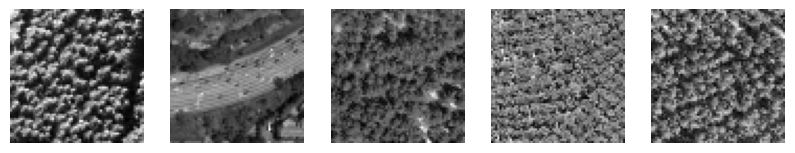

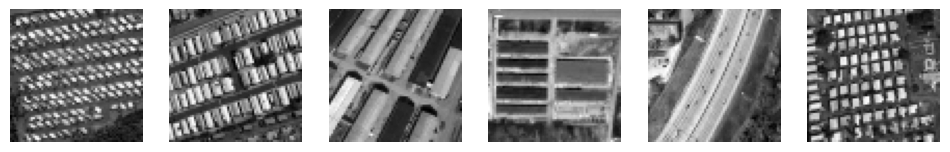

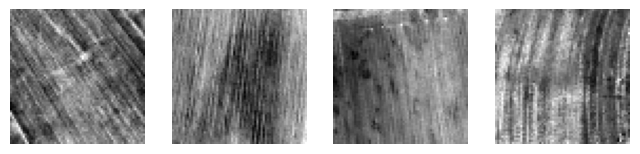

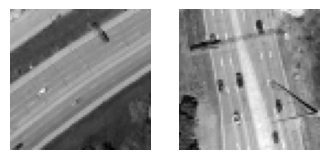

In [6]:
for i in range(CLUSTER_NUM):
    cluster_idxs = np.where(labels == i)[0]

    if len(cluster_idxs) == 0:
        continue
    
    fig, axes = plt.subplots(1, len(cluster_idxs), figsize=(len(cluster_idxs)*2, len(cluster_idxs)))
    
    if len(cluster_idxs) == 1:
        axes.imshow(imgs[cluster_idxs[0]], cmap='gray')
        axes.axis('off')
        continue
    
    for ax, im_idx in zip(axes.flatten(), cluster_idxs):
        ax.imshow(imgs[im_idx], cmap='gray')
        ax.axis('off')